In [1]:
import os
import torch
from deeplsd.models.deeplsd_inference import DeepLSD
from line_prediction.pipeline import prediction_pipeline, plot_pipeline_results
from line_understanding.json_saver import save_lines_to_json 


In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
conf = {'detect_lines': True, 'line_detection_params': {'merge': False, 'filtering': True, 'grad_thresh': 3}}
ckpt = torch.load('../weights/deeplsd_md.tar', map_location='cpu', weights_only=False)
net = DeepLSD(conf)
net.load_state_dict(ckpt['model'])
net = net.to(device).eval()



moge_pred
data/ai_001_001/image.jpg
data/ai_001_001/moge/frame.ai_001_001.depth_meters.hdf5
data/ai_001_001/moge/frame.ai_001_001.K.hdf5
data/ai_001_001/moge/frame.ai_001_001.mask.hdf5
data/ai_001_001/moge/frame.ai_001_001.position.hdf5


/Users/marvin/Documents/ETHZ/MA4/3DVision/repo/DeepLSD/notebooks/line_prediction/utility_methods.py:221: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-lam * (x - tau)))


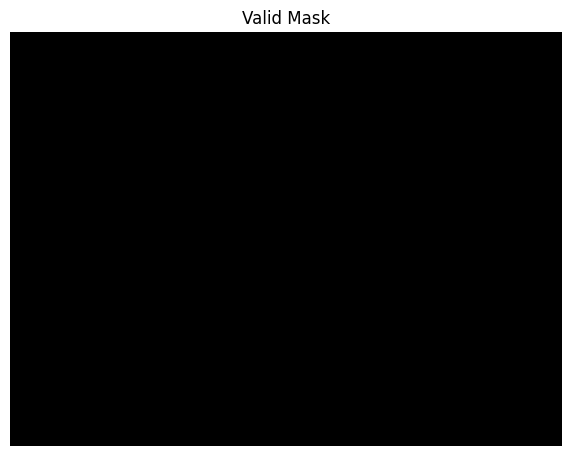

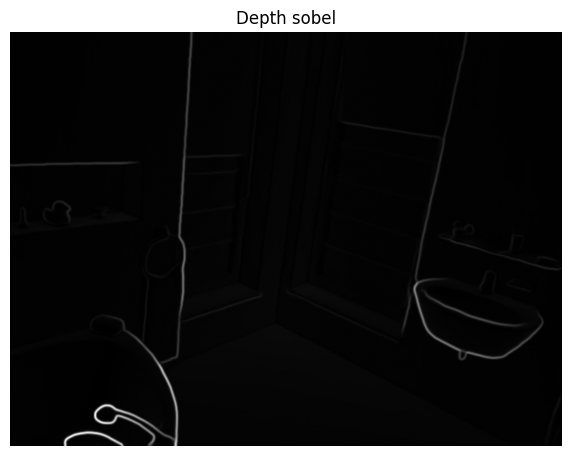

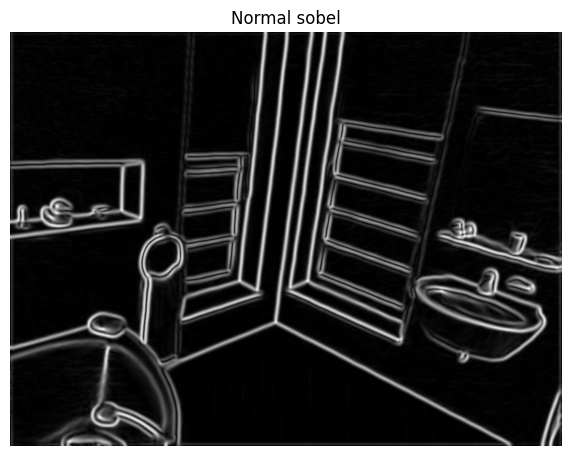

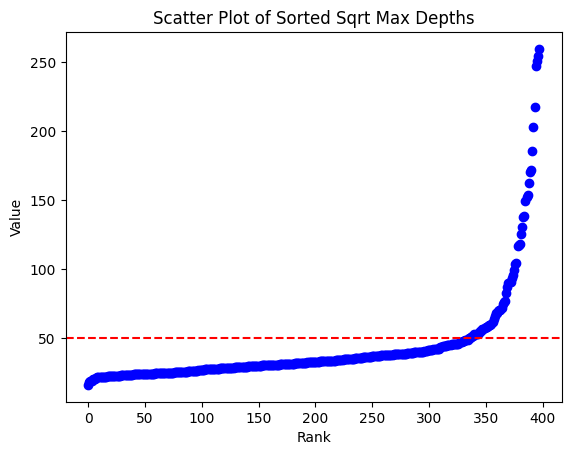

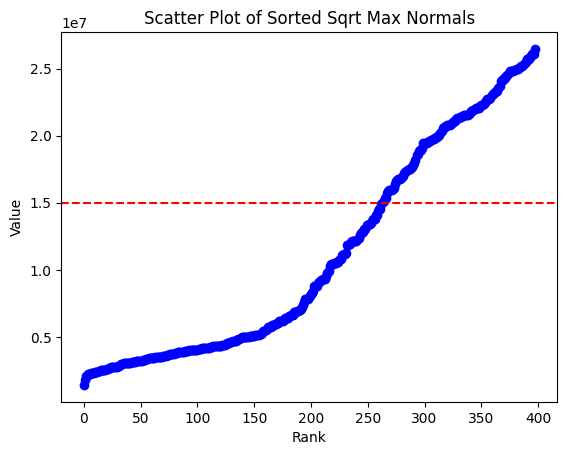

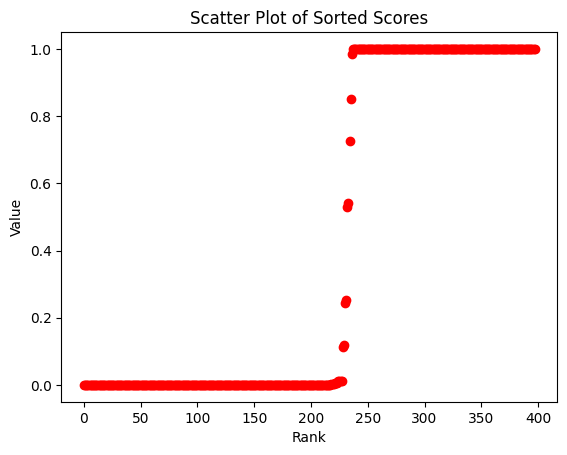

[Neighborhood Method] ai_001_001: Detected 398 lines; 164 structural.


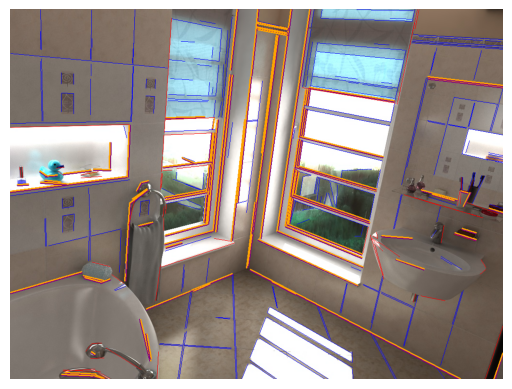

/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


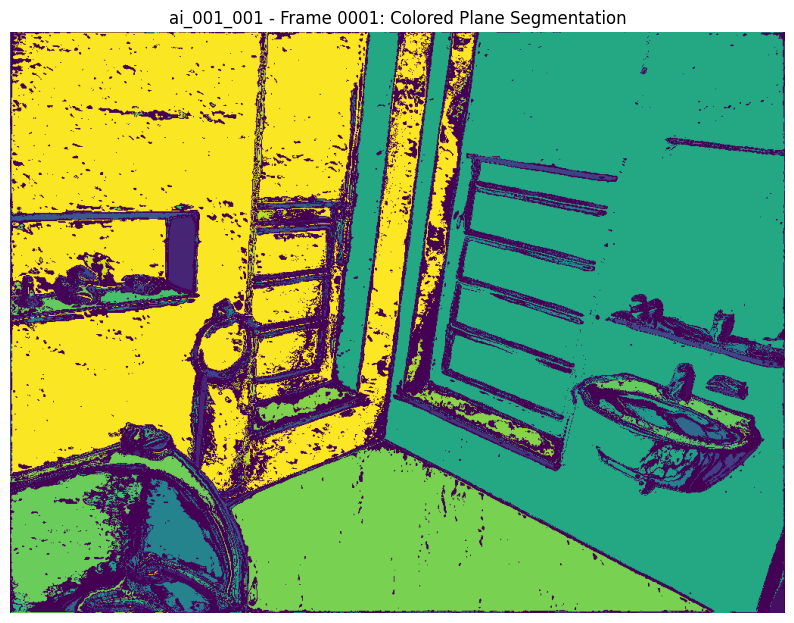

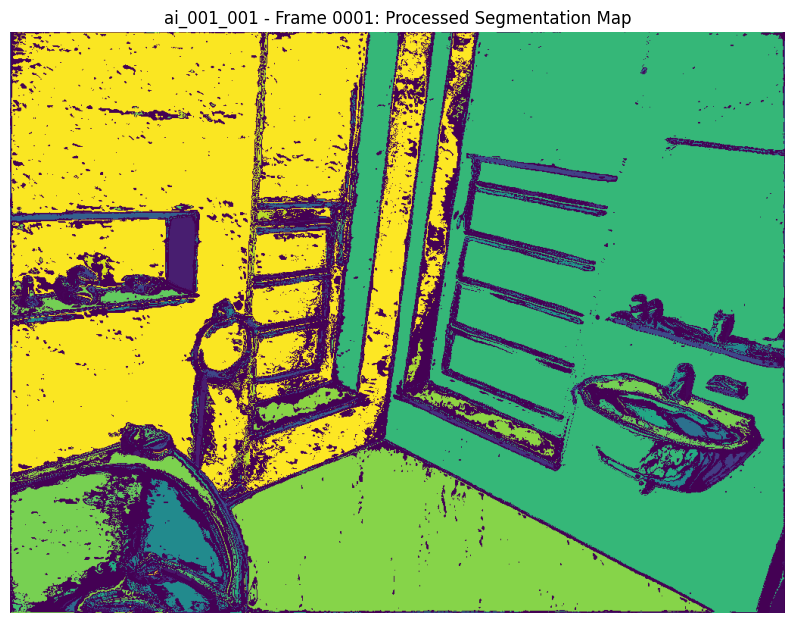

Unique Labels: [-1, 17, 33, 78, 117, 121, 145, 606, 1056, 1234, 1378, 1608, 2198, 2684, 4055, 4787, 4788, 5469, 5704, 5707, 5780, 5888, 7150, 7195, 7197]
Number of Clusters: 25


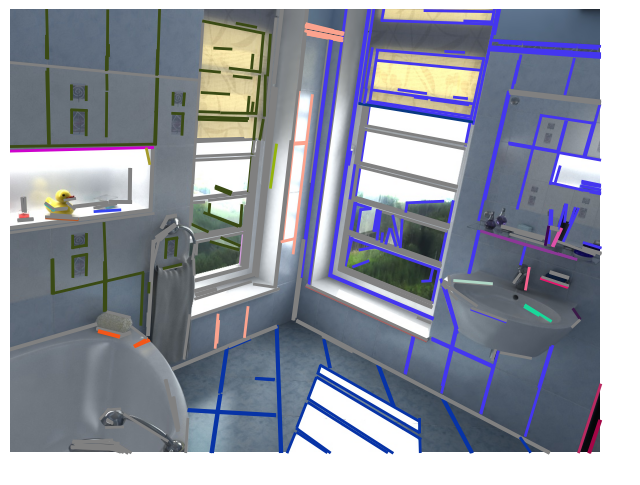

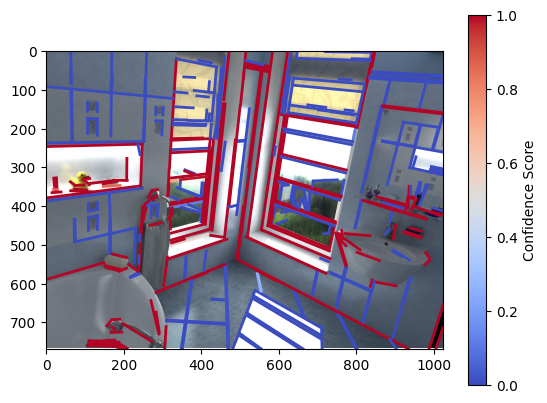

moge_pred
data/DSC_0442/image.jpg
data/DSC_0442/moge/frame.DSC_0442.depth_meters.hdf5
data/DSC_0442/moge/frame.DSC_0442.K.hdf5
data/DSC_0442/moge/frame.DSC_0442.mask.hdf5
data/DSC_0442/moge/frame.DSC_0442.position.hdf5


/Users/marvin/Documents/ETHZ/MA4/3DVision/repo/DeepLSD/notebooks/line_prediction/utility_methods.py:221: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-lam * (x - tau)))


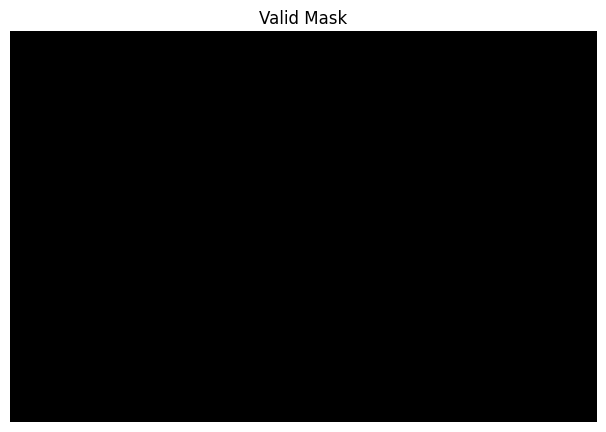

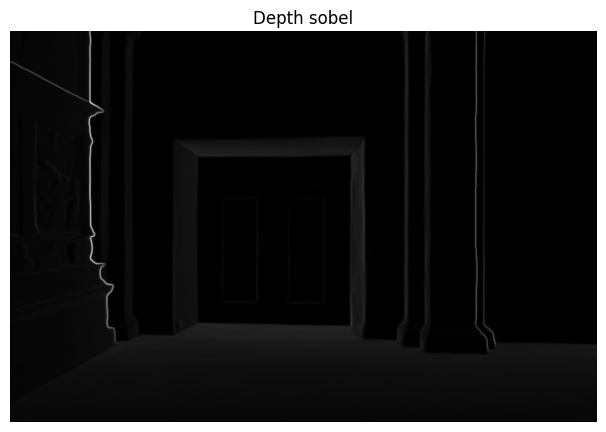

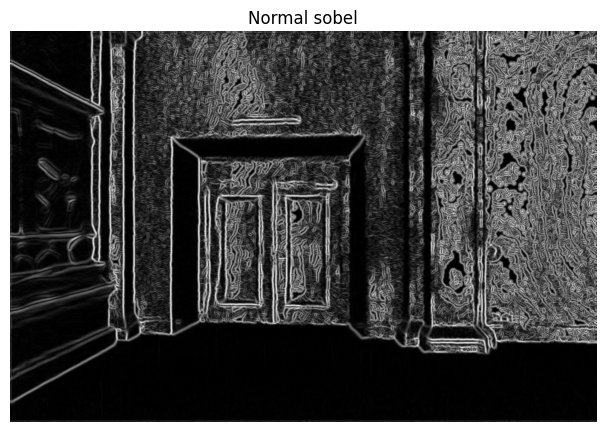

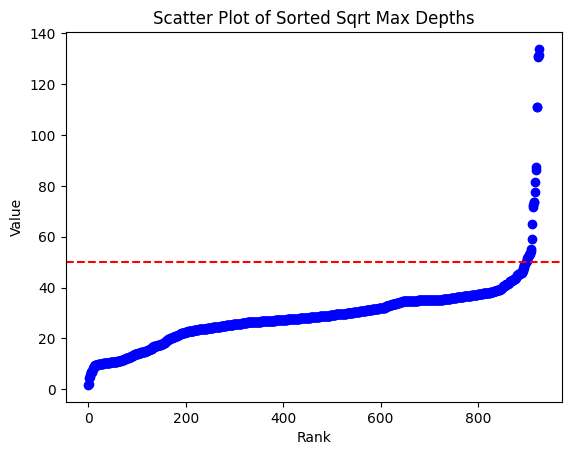

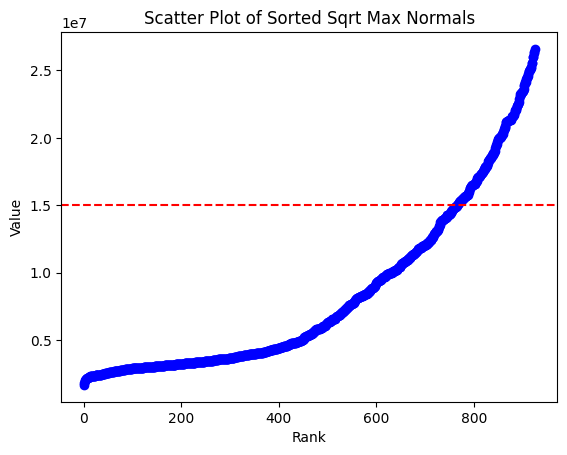

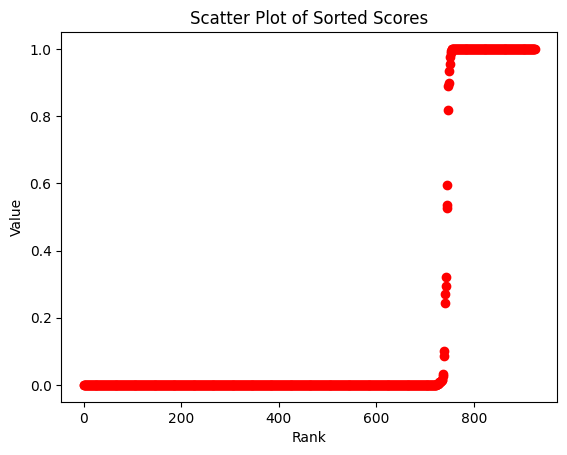

[Neighborhood Method] DSC_0442: Detected 926 lines; 179 structural.


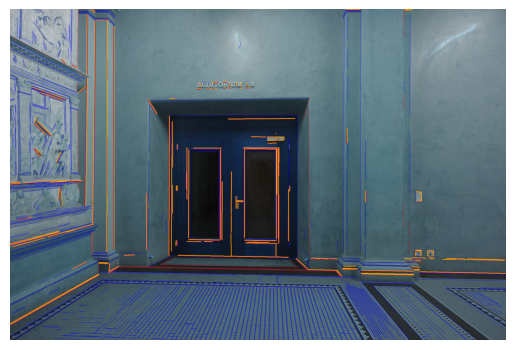

/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


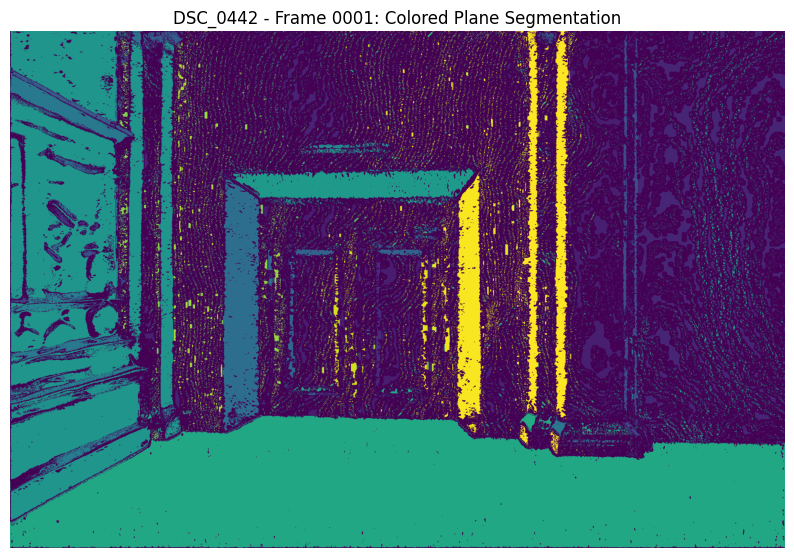

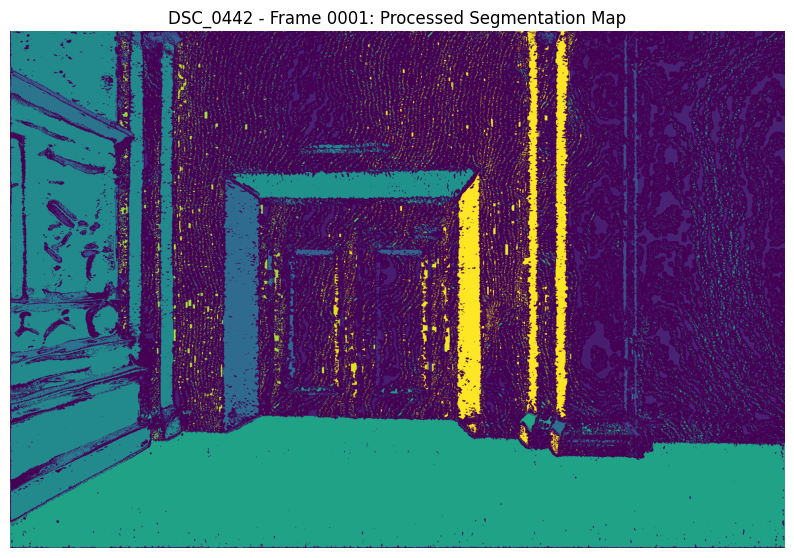

Unique Labels: [-1, 5613, 8181, 16326, 16329, 16339, 17170, 17171, 20715, 22415, 22416, 23643, 25041, 25090, 25580, 27034, 27149, 27412, 28332, 29212, 29546, 31277, 32103, 33159, 34265, 34268, 34269, 34270, 34271, 36311, 40999, 41199, 42565, 68173, 68201, 70268, 70774, 71081, 71084, 71215, 71428, 71483]
Number of Clusters: 42


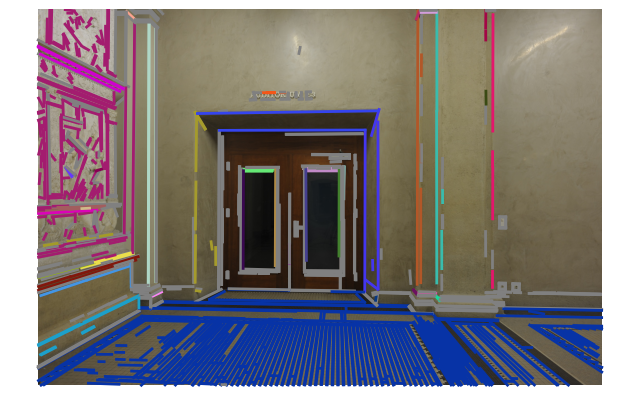

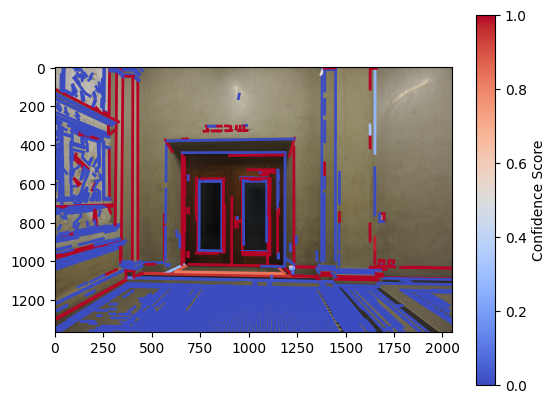

moge_pred
data/DSC_0455/image.jpg
data/DSC_0455/moge/frame.DSC_0455.depth_meters.hdf5
data/DSC_0455/moge/frame.DSC_0455.K.hdf5
data/DSC_0455/moge/frame.DSC_0455.mask.hdf5
data/DSC_0455/moge/frame.DSC_0455.position.hdf5


/Users/marvin/Documents/ETHZ/MA4/3DVision/repo/DeepLSD/notebooks/line_prediction/utility_methods.py:221: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-lam * (x - tau)))


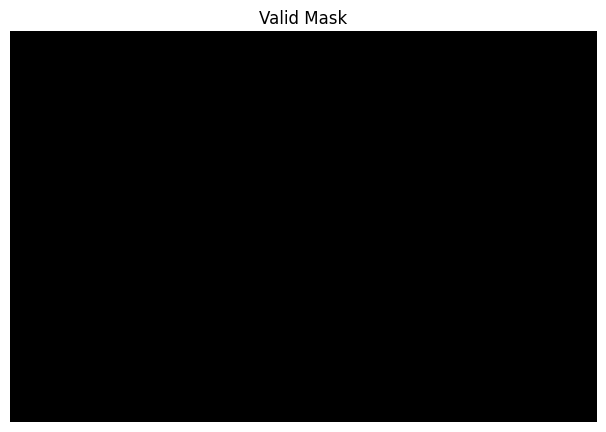

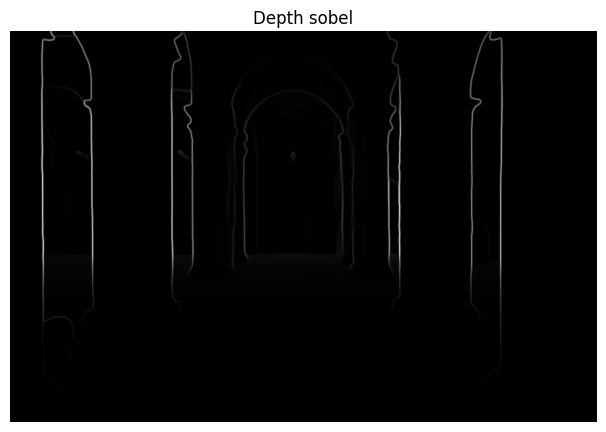

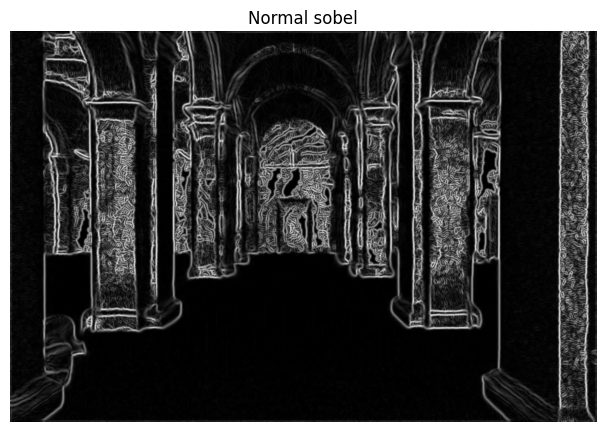

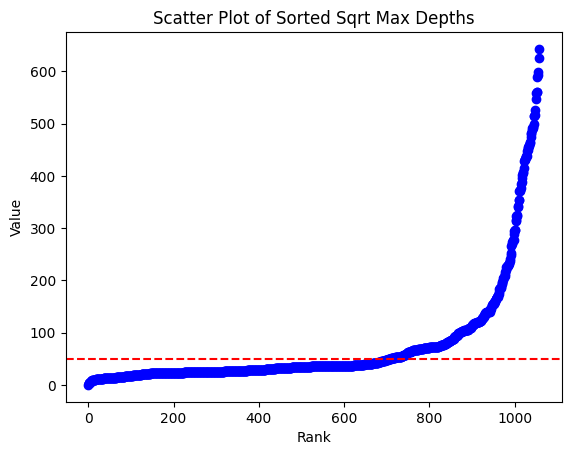

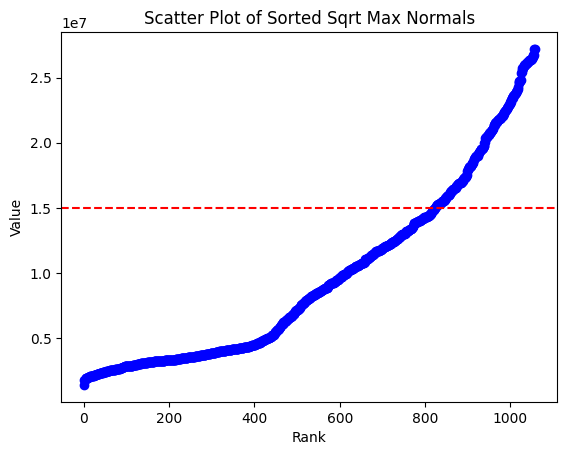

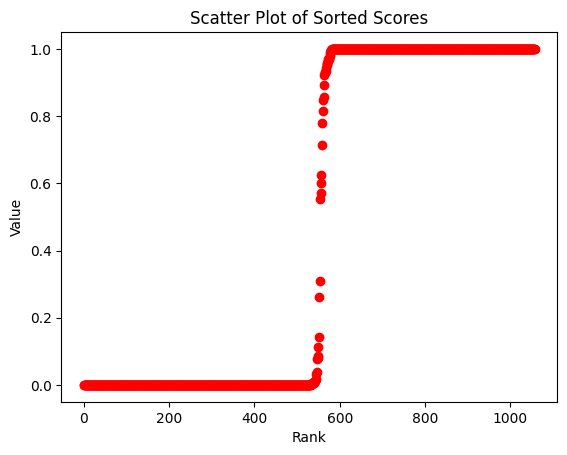

[Neighborhood Method] DSC_0455: Detected 1058 lines; 502 structural.


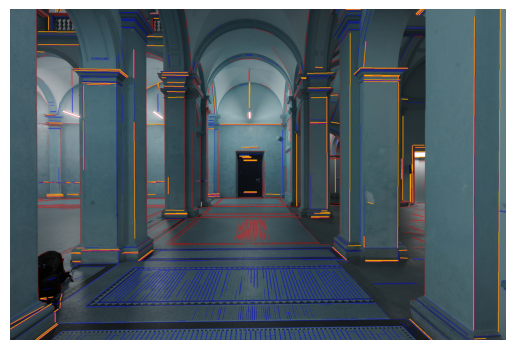

/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


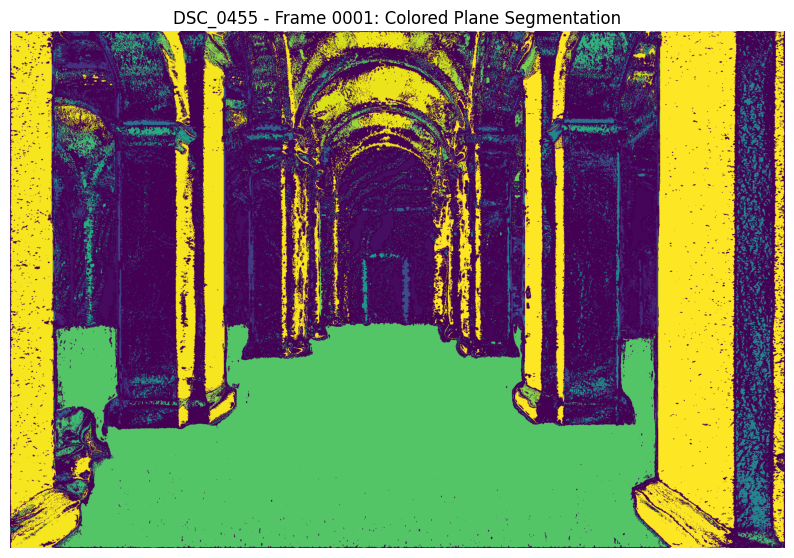

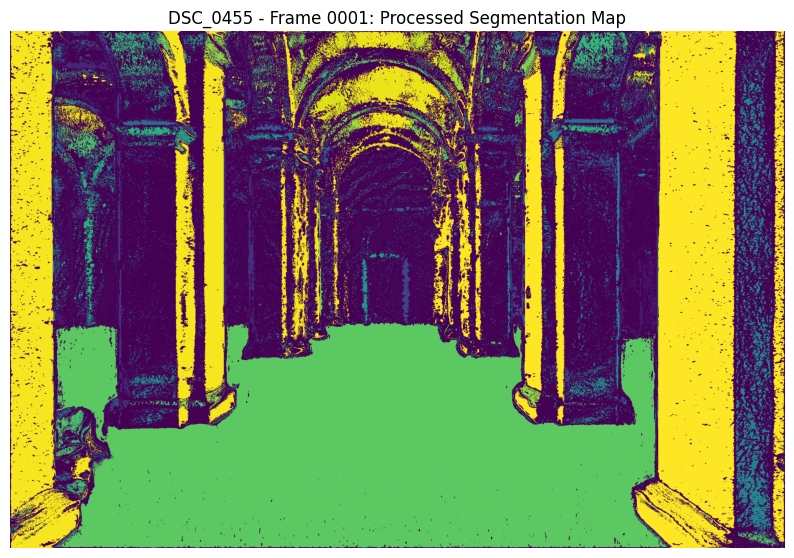

Unique Labels: [-1, 501, 1057, 1711, 3305, 4154, 4431, 4565, 6560, 9873, 10675, 12450, 16309, 16715, 17994, 21308, 27407, 28016, 32552, 33534, 34554, 35486, 39161, 39167, 39169, 42808, 44072, 46043, 47456, 47765, 48820, 49941, 51340, 58400, 60125, 60637, 60646, 60846, 60847, 60851, 60853, 60856, 60857, 60858, 60860, 60871, 60873, 61292, 61693, 61695, 61696, 61697, 61698, 61700, 61702, 61706, 61708, 61709, 61710]
Number of Clusters: 59


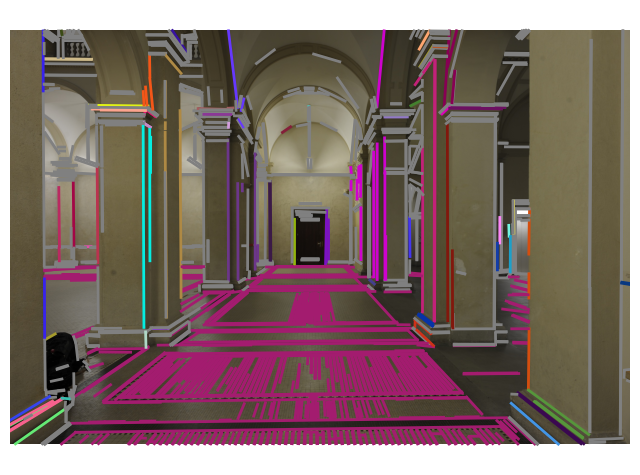

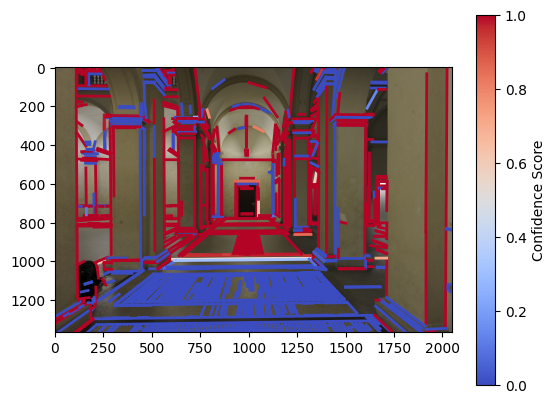

In [5]:
#OLD
frame_str = "0001"
desired_images = [
    "ai_001_001",
    "DSC_0442",
    "DSC_0455",
]

# Process, plot, and save JSON data for each image.
for image_id in desired_images:
    processed_data = prediction_pipeline(image_id, frame_str, net, device, depth_thresh=50, normal_thresh=1.5 * 1e7, cluster_selection_epsilon=0.002, 
        min_cluster_size=25, dataset="moge_pred")
    if processed_data is not None:
        plot_pipeline_results(processed_data, frame_str)

moge_pred
data/DSC_0239/image.jpg
data/DSC_0239/moge/frame.DSC_0239.depth_meters.hdf5
data/DSC_0239/moge/frame.DSC_0239.K.hdf5
data/DSC_0239/moge/frame.DSC_0239.mask.hdf5
data/DSC_0239/moge/frame.DSC_0239.position.hdf5


/Users/marvin/Documents/ETHZ/MA4/3DVision/repo/DeepLSD/notebooks/line_prediction/utility_methods.py:221: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-lam * (x - tau)))


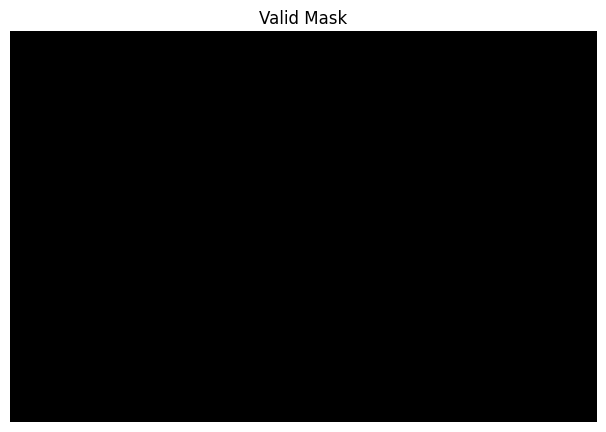

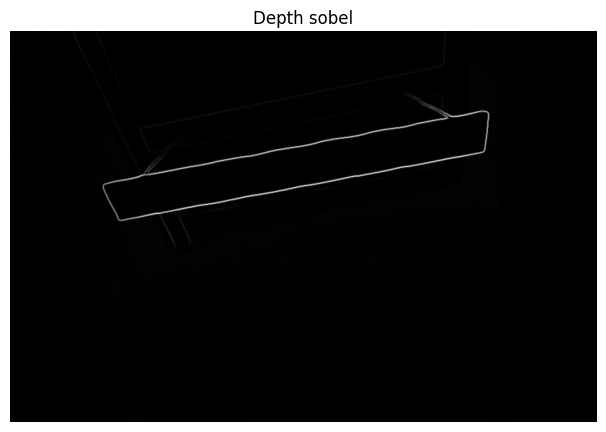

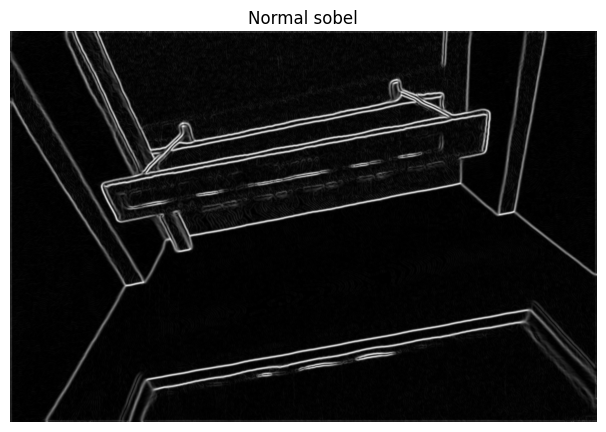

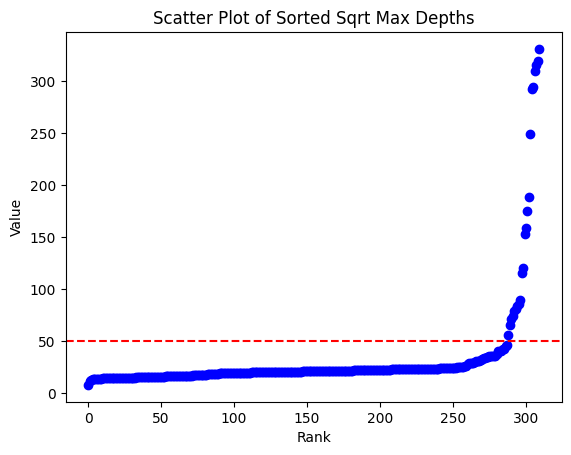

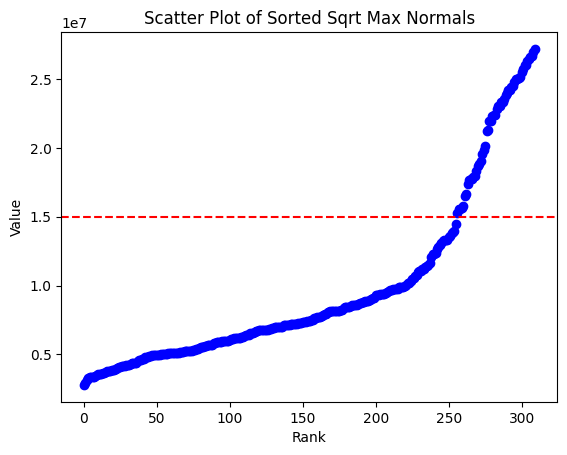

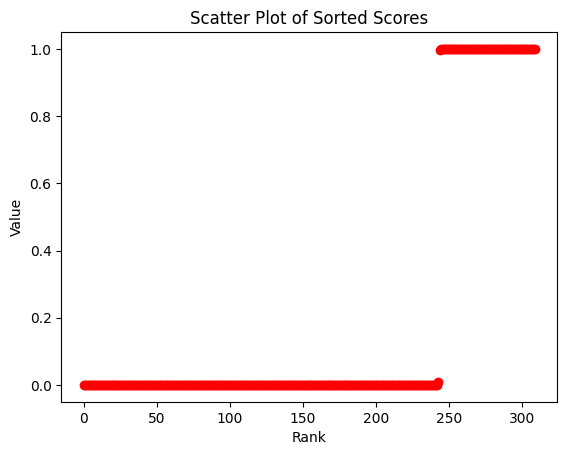

[Neighborhood Method] DSC_0239: Detected 310 lines; 66 structural.


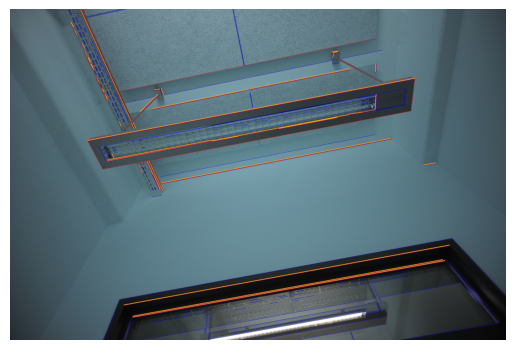

/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


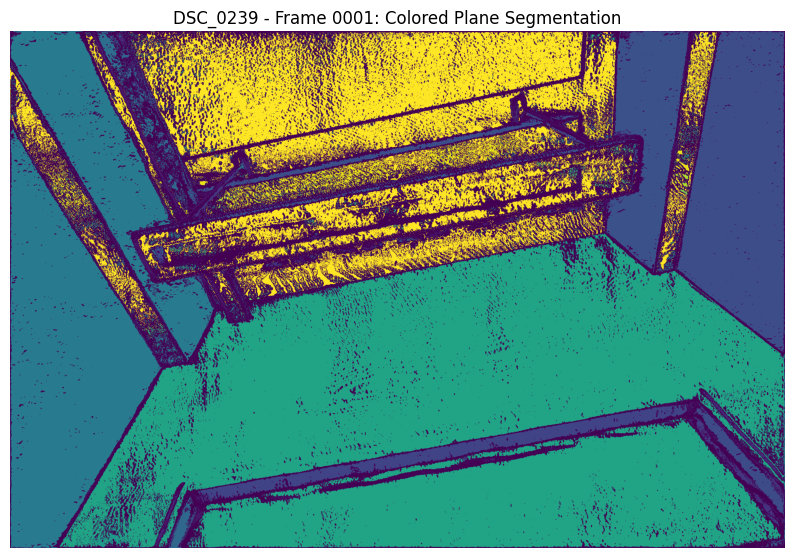

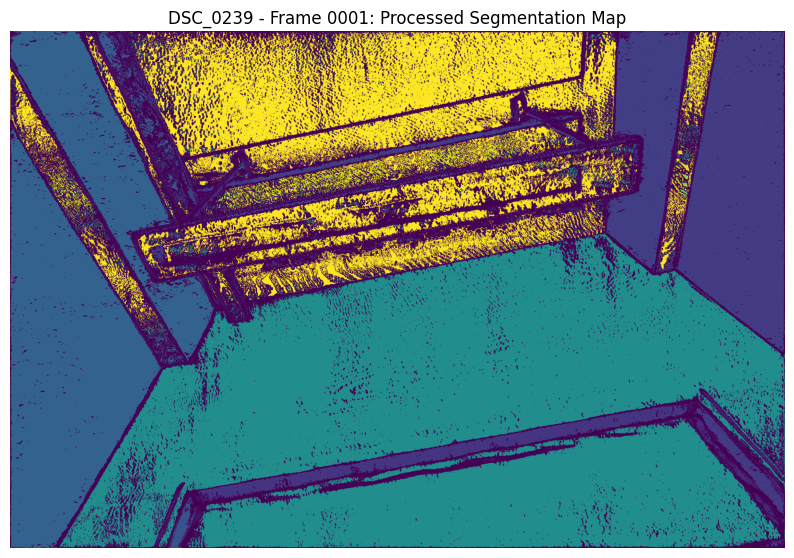

Unique Labels: [-1, 1062, 1444, 1543, 1726, 1732, 1993, 2999, 3479, 4700, 5796, 5917, 6673, 6716, 6744, 9345, 9350, 10227, 10708, 18409, 18410, 35723, 37239, 37426]
Number of Clusters: 24


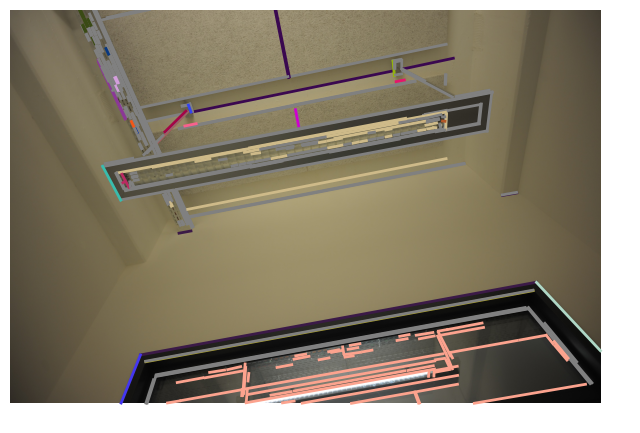

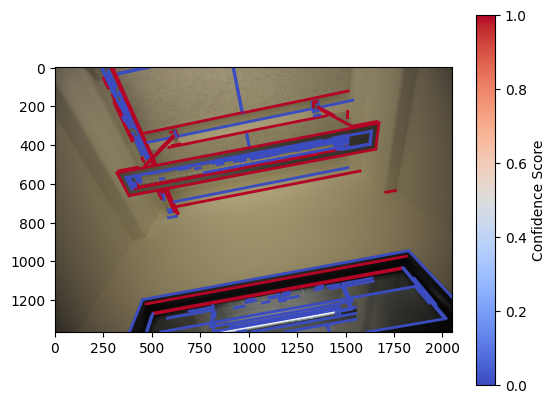

moge_pred
data/DSC_0249/image.jpg
data/DSC_0249/moge/frame.DSC_0249.depth_meters.hdf5
data/DSC_0249/moge/frame.DSC_0249.K.hdf5
data/DSC_0249/moge/frame.DSC_0249.mask.hdf5
data/DSC_0249/moge/frame.DSC_0249.position.hdf5


/Users/marvin/Documents/ETHZ/MA4/3DVision/repo/DeepLSD/notebooks/line_prediction/utility_methods.py:221: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-lam * (x - tau)))


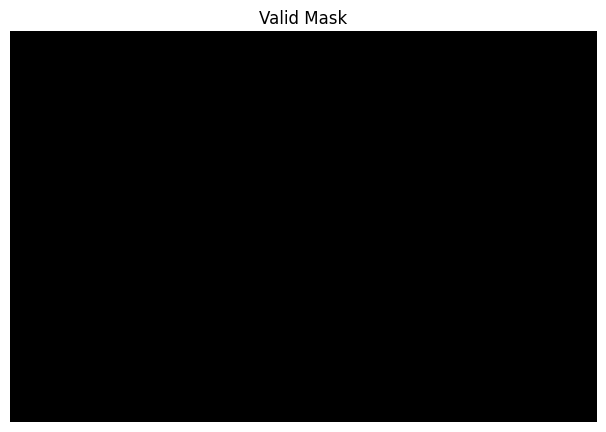

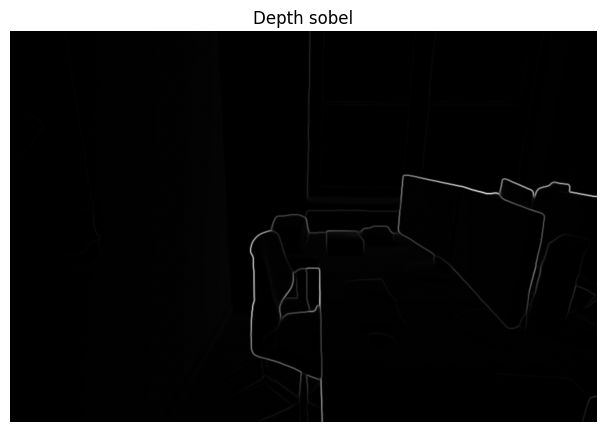

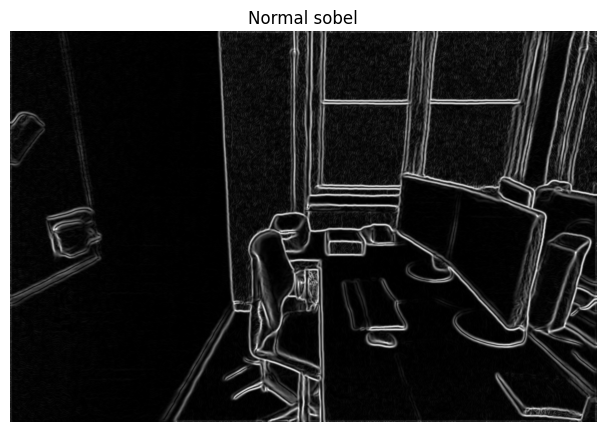

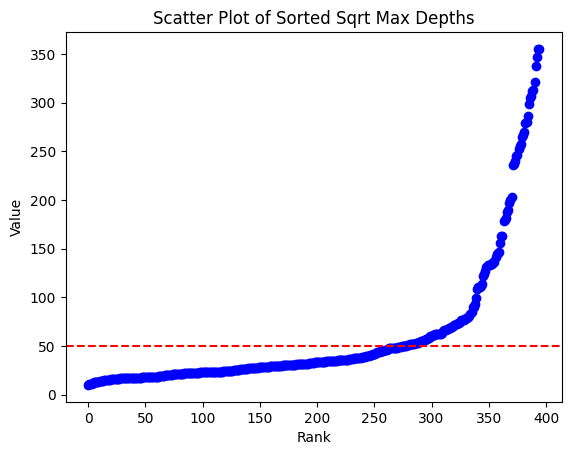

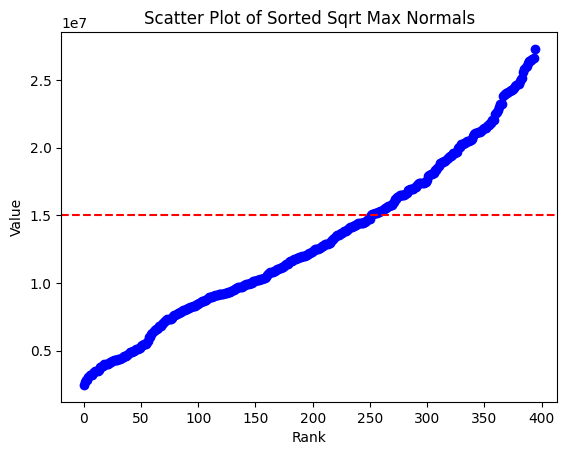

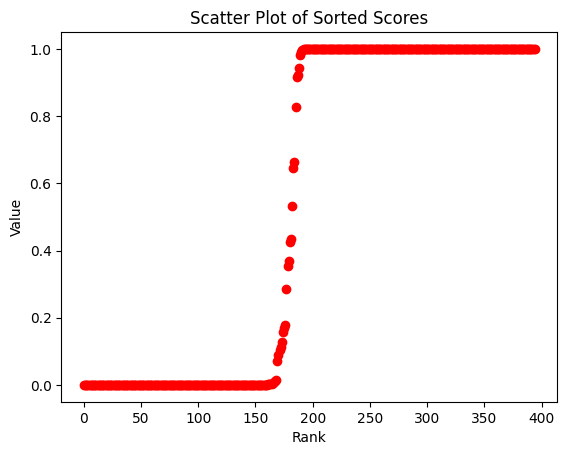

[Neighborhood Method] DSC_0249: Detected 395 lines; 212 structural.


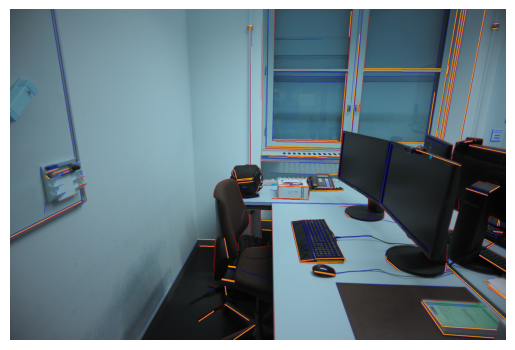

/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


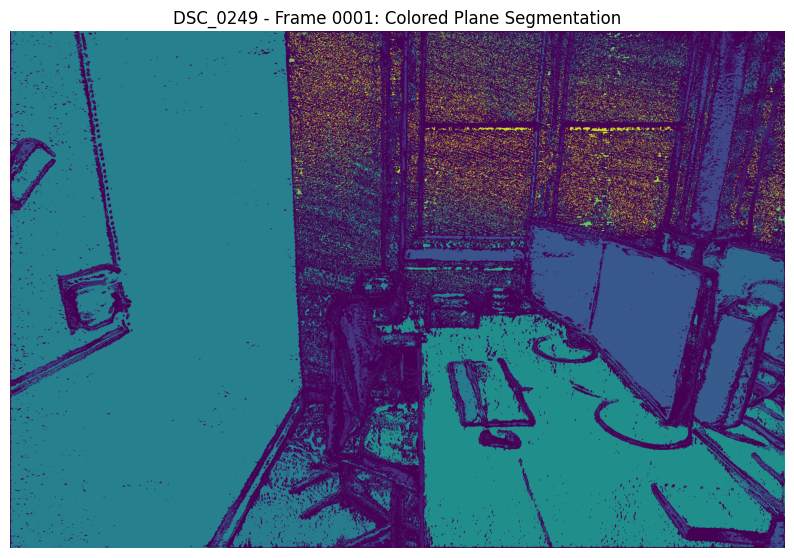

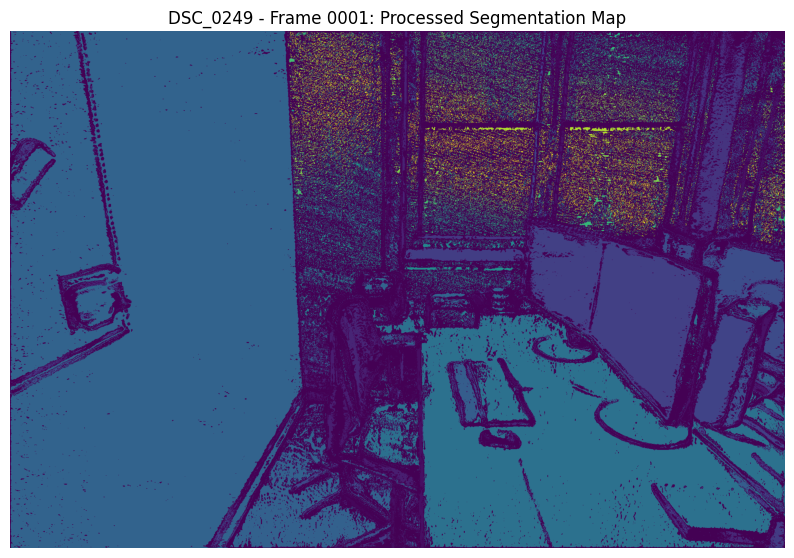

Unique Labels: [-1, 112, 113, 200, 1152, 3848, 4048, 8343, 9170, 11806, 14920, 15626, 16226, 17541, 18335, 18552, 19700, 21509, 21929, 22915, 28171, 28626, 28812, 30879, 30916, 31157, 36196, 85586]
Number of Clusters: 28


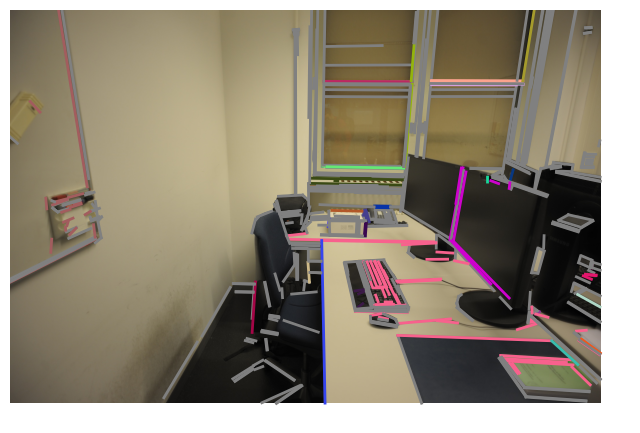

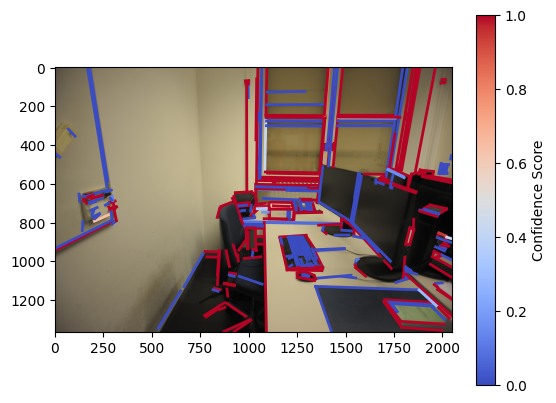

In [6]:
#OLD
frame_str = "0001"
desired_images = [
    "DSC_0239",
    "DSC_0249",
    
]

# Process, plot, and save JSON data for each image.
for image_id in desired_images:
    processed_data = prediction_pipeline(image_id, frame_str, net, device, depth_thresh=50, normal_thresh=1.5 * 1e7, cluster_selection_epsilon=0.002, 
        min_cluster_size=25, dataset="moge_pred")
    if processed_data is not None:
        plot_pipeline_results(processed_data, frame_str)
        
    # processed_data = process_image_pipeline_2(image_id, frame_str, net, device)
    # if processed_data is not None:
    #     plot_pipeline_results(processed_data, frame_str)
    
